In [2020]:
# %pip install pandas numpy folium sklearn geopandas geopy shapely scipy matplotlib deap

In [2021]:
import numpy as np
import pandas as pd

In [2022]:
def turkish_capitalize(word):
    chars = {
        'I': 'ı',
        'İ': 'i',
        'Ş': 'ş',
        'Ğ': 'ğ',
        'Ü': 'ü',
        'Ö': 'ö',
        'Ç': 'ç'
    }

    word = word.strip().upper()

    lower = ''
    for i in word:
        if i in chars:
            lower += chars[i]
        else:
            lower += i.lower()

    if lower:
        return lower[0].upper().replace('I', 'İ').replace('i', 'İ') + lower[1:]
    else:
        return lower

In [2023]:
land_price_df = pd.read_csv(r"data\Average zoned land price.csv")

land_price_df = land_price_df.rename(columns={'ilce': 'District', 'metrekare_birim_fiyat': 'price_per_square'})
land_price_df = land_price_df[['District', 'price_per_square']]
land_price_df

,District,price_per_square
0,Adalar,33212
1,Bakırköy,121816
2,Beşiktaş,165072
3,Beykoz,22091
4,Beyoğlu,134165
5,Çatalca,7276
6,Eyüpsultan,44936
7,Fatih,62307
8,Gaziosmanpaşa,66911
9,Kadıköy,92193


In [2024]:
rent_price_df = pd.read_csv(r"data\istanbul kira.csv")

rent_price_df['Ort. Değer (₺)'] = rent_price_df['Ort. Değer (₺)'].fillna(rent_price_df['Ort. Değer (₺)'].mean())
rent_price_df = rent_price_df.rename(columns={'Ort. Değer (₺)': 'mean_rent', 'İlçeler': 'District'})
rent_price_df = rent_price_df[['District', 'mean_rent']]
rent_price_df

,District,mean_rent
0,Adalar,28055.868421
1,Bakırköy,44013.000000
2,Beşiktaş,58510.000000
3,Beykoz,33159.000000
4,Beyoğlu,30617.000000
5,Çatalca,21226.000000
6,Eyüpsultan,28571.000000
7,Fatih,18923.000000
8,Gaziosmanpaşa,22215.000000
9,Kadıköy,53678.000000


In [2025]:
crime_df = pd.read_csv(r"data\crime rates.csv")
crime_df['Crime %00'] = crime_df['Crime %00'].apply(lambda x: x.replace(',', '.')).astype(float)

crime_df = crime_df.rename(columns={'Districts': 'District', 'Crime %00': 'crime_rate'})
crime_df = crime_df[['District', 'crime_rate']]
crime_df

,District,crime_rate
0,Eminönü,0.024
1,Beyoğlu,0.017
2,Fatih,0.015
3,Şişli,0.014
4,Beşiktaş,0.015
5,Üsküdar,0.005
6,Zeytinburnu,0.005
7,Kadıköy,0.007
8,Eyüp,0.005
9,Bakırköy,0.007


In [2026]:
population_df = pd.read_csv(r"data\istanbul_ilçe_nufüs.csv")

population_df = population_df.rename(columns={'İl ve ilçe': 'District', 'Total': 'total_population'})
population_df = population_df[['District', 'total_population']]
population_df

,District,total_population
0,Adalar,16979
1,Arnavutköy,344868
2,Ataşehir,414866
3,Avcılar,440934
4,Bağcılar,713594
5,Bahçelievler,560086
6,Bakırköy,219893
7,Başakşehir,520467
8,Bayrampaşa,268303
9,Beşiktaş,167264


In [2027]:
air_df = pd.read_csv(r"data\Hava Kalitesi Durumları Günlük.csv")
air_df['air_score'] = air_df['Uygun'] * 5 + air_df['İyi'] * 4 + air_df['Orta'] * 3 + air_df['Kötü'] * 2 + air_df['Çok Kötü'] / (air_df['Uygun'] + air_df['İyi'] + air_df['Orta'] + air_df['Kötü'] + air_df['Çok Kötü'])

air_df = air_df.rename(columns={'İlçe': 'District'})
air_df = air_df[['District', 'air_score']]
air_df

,District,air_score
0,Arnavutköy,578.000000
1,Avcılar,501.000000
2,Bağcılar,486.006944
3,Başakşehir,318.027523
4,Beşiktaş,525.000000
5,Beylikdüzü,474.021739
6,Esenler,449.035461
7,Esenyurt,283.109091
8,Fatih,369.055944
9,Eyüpsultan,510.000000


In [2028]:
earthquake_df = pd.read_csv(r"data\ilce_bazlı_sosyal_hasar_gorulebilirlik_puanlari.csv")

earthquake_df = earthquake_df.rename(columns={'İlçeler': 'District', 'Ortalama': 'earthquake_score'})
earthquake_df = earthquake_df[['District', 'earthquake_score']]
earthquake_df = earthquake_df.iloc[:-1]
earthquake_df

,District,earthquake_score
0,Adalar,45.05
1,Arnavutköy,51.95
2,Ataşehir,52.89
3,Avcılar,50.44
4,Bağcılar,52.49
5,Bahçelievler,49.21
6,Bakırköy,45.83
7,Başakşehir,47.53
8,Bayrampaşa,50.95
9,Beşiktaş,43.38


In [2029]:
gas_df = pd.read_csv(r"data\ilce-baznda-aylk-doalgaz-tuketim-miktar-2015-2023-nisan.csv")
gas_df.drop(gas_df[gas_df['Yıl'] != 2023].index, axis=0, inplace=True)

gas_df = gas_df.groupby('İlçe').mean()

gas_df.reset_index(inplace=True)
gas_df['İlçe'] = gas_df['İlçe'].apply(turkish_capitalize)
gas_df = gas_df[['İlçe', 'Dogalgaz Tüketim Miktarı (m3)']]
gas_df = gas_df.rename(columns={'İlçe': 'District', 'Dogalgaz Tüketim Miktarı (m3)': 'mean_gas_consumption'})
gas_df

,District,mean_gas_consumption
0,Adalar,8.356043e+05
1,Arnavutköy,2.354481e+07
2,Ataşehir,2.571509e+07
3,Avcılar,2.160381e+07
4,Bahçelievler,2.718922e+07
5,Bakırköy,2.137677e+07
6,Bayrampaşa,1.288822e+07
7,Bağcılar,3.147634e+07
8,Başakşehir,2.809423e+07
9,Beykoz,1.632130e+07


In [2030]:
healthcare_df = pd.read_csv(r"data\Sağlık Kurum ve Kuruluşlarına İlişkin Bilgiler.csv")

healthcare_df['Ilce Adi'] = healthcare_df['Ilce Adi'].apply(turkish_capitalize)

subcategory_weights = {
    'Şehir Hastanesi': 10,
    'Eğitim Araştırma Hastanesi': 10,
    'Üniversite Hastanesi': 10,
    'Kadın Doğum ve Çocuk Hastanesi': 10,
    'Devlet Hastanesi': 9,
    'Özel Hastane': 9,

    'Tıp Merkezi Özel': 8,
    'Ağız Diş Sağlığı Merkezi': 8,
    'Toplum Sağlığı Merkezi': 8,
    'Fizik Tedavi ve Rehabilitasyon Merkezi': 7,
    'Fizik Tedavi ve Rehabilitasyon Merkezi Özel': 7,
    'Verem Savaş Dispanseri': 7,
    'Semt Poliklinikleri': 6,
    'Aile Sağlığı Merkezi': 6,
    'Belediye Sağlık Merkezi': 6,
    'Rehabilitasyon ve Aile Danışma Merkezi': 6,

    'Laboratuvar Özel': 5,
    'Görüntüleme Merkezi Özel': 5,
    'Diyaliz Merkezi': 5,
    'Diyaliz Merkezi Özel': 5,
    'Tüp Bebek Merkezi': 5,
    'Kızılay/Kan Merkezi': 4,
    'Psikoteknik Değerlendirme Merkezi': 4,
    'Protez Ortez Yapım ve Uygulama Merkezi Özel': 4,
    'İşitme Cihazı Satış ve Uygulama Merkezi': 4,
    'Özel Tanı Tedavi Merkezleri': 4,
    'Ecza Deposu': 4,

    'Doktor/Muayenehane': 3,
    'Diş Hekimi': 3,
    'Poliklinik Özel': 3,
    'Psikologlar': 3,
    'Diyetisyen': 3,
    'Göz Merkezi Özel': 3,
    'Özel Ağız ve Diş Sağlığı Merkezleri': 3,

    'Eczane': 2,
    'Gözlükçü/Optik': 2,
    'Sağlık Kabini Özel': 2,
    'Medikal': 2,

    'Veteriner': 1,
    'Yaşlı Bakım Evi/Huzurevi': 1,
    'Evde Bakım Merkezleri': 1,
    'Belediye Hizmet Binası': 1,
    'Sağlık Diğer': 1,
    'Diş Laboratuvarı': 1,
}

healthcare_df['healthcare_score'] = healthcare_df['Alt Kategori'].map(subcategory_weights).fillna(1)
healthcare_df = healthcare_df.rename(columns={'Ilce Adi': 'District'})
healthcare_df = healthcare_df[['District', 'healthcare_score']].groupby('District').sum()
healthcare_df = healthcare_df.merge(population_df, on='District')
healthcare_df['healthcare_score'] = healthcare_df['healthcare_score'] / healthcare_df['total_population']
healthcare_df.drop(columns=[col for col in population_df.columns if col != "District"], inplace=True)

healthcare_df = healthcare_df[['District', 'healthcare_score']]
healthcare_df

,District,healthcare_score
0,Adalar,0.006125
1,Arnavutköy,0.001821
2,Ataşehir,0.004597
3,Avcılar,0.002300
4,Bahçelievler,0.003260
5,Bakırköy,0.008413
6,Bayrampaşa,0.004148
7,Bağcılar,0.002486
8,Başakşehir,0.002256
9,Beykoz,0.003027


In [2031]:
dorm_df = pd.read_csv(r"data\dorm_capacity.csv")

dorm_df = dorm_df.rename(columns={'İlçe Adı': 'District', 'Kapasite': 'Capacity', 'fiyat': 'Cost'})
dorm_df = dorm_df[['District', 'Capacity', 'Cost']]
dorm_df

,District,Capacity,Cost
0,Zeytinburnu,3555,38.75
1,Kadıköy,1082,18.09
2,Beykoz,374,2.22
3,Avcılar,348,2.24
4,Fatih,790,10.00
5,Fatih,1248,12.55
6,Esenyurt,500,4.27
7,Güngören,3240,8.21
8,Küçükçekmece,1135,7.79
9,Fatih,723,10.00


In [2032]:
district_level_features = land_price_df.merge(rent_price_df, how='left', on='District').merge(crime_df, how='left', on='District').merge(population_df, how='left', on='District').merge(air_df, how='left', on='District').merge(earthquake_df, how='left', on='District').merge(gas_df, how='left', on='District').merge(healthcare_df, how='left', on='District')
the_df = dorm_df.merge(land_price_df, how='left', on='District').merge(rent_price_df, how='left', on='District').merge(crime_df, how='left', on='District').merge(population_df, how='left', on='District').merge(air_df, how='left', on='District').merge(earthquake_df, how='left', on='District').merge(gas_df, how='left', on='District').merge(healthcare_df, how='left', on='District')
the_df

,District,Capacity,Cost,price_per_square,mean_rent,crime_rate,total_population,air_score,earthquake_score,mean_gas_consumption,healthcare_score
0,Zeytinburnu,3555,38.75,108518,28125.0,0.005,278344,NaN,50.67,1.420012e+07,0.003338
1,Kadıköy,1082,18.09,92193,53678.0,0.007,462189,463.055556,46.31,4.100008e+07,0.012240
2,Beykoz,374,2.22,22091,33159.0,0.005,245440,NaN,50.31,1.632130e+07,0.003027
3,Avcılar,348,2.24,25524,20661.0,0.005,440934,501.000000,50.44,2.160381e+07,0.002300
4,Fatih,790,10.00,62307,18923.0,0.015,354472,369.055944,50.79,2.145187e+07,0.010480
5,Fatih,1248,12.55,62307,18923.0,0.015,354472,369.055944,50.79,2.145187e+07,0.010480
6,Esenyurt,500,4.27,35708,16894.0,NaN,988369,283.109091,51.58,5.685849e+07,0.001774
7,Güngören,3240,8.21,87743,21148.0,0.003,264831,NaN,50.73,1.245634e+07,0.002745
8,Küçükçekmece,1135,7.79,37888,24755.0,0.004,789033,NaN,50.42,3.901133e+07,0.002247
9,Fatih,723,10.00,62307,18923.0,0.015,354472,369.055944,50.79,2.145187e+07,0.010480


In [2033]:
the_df.isna().sum()

District                0
Capacity                0
Cost                    0
price_per_square        0
mean_rent               0
crime_rate              7
total_population        0
air_score               6
earthquake_score        1
mean_gas_consumption    0
healthcare_score        0
dtype: int64

In [2034]:
district_level_features.iloc[:, 1:] = district_level_features.iloc[:, 1:].fillna(district_level_features.iloc[:, 1:].mean())
the_df.iloc[:, 1:] = the_df.iloc[:, 1:].fillna(the_df.iloc[:, 1:].mean())
the_df.isna().sum()

District                0
Capacity                0
Cost                    0
price_per_square        0
mean_rent               0
crime_rate              0
total_population        0
air_score               0
earthquake_score        0
mean_gas_consumption    0
healthcare_score        0
dtype: int64

In [2035]:
the_df

,District,Capacity,Cost,price_per_square,mean_rent,crime_rate,total_population,air_score,earthquake_score,mean_gas_consumption,healthcare_score
0,Zeytinburnu,3555,38.75,108518,28125.0,0.005000,278344,388.724536,50.670,1.420012e+07,0.003338
1,Kadıköy,1082,18.09,92193,53678.0,0.007000,462189,463.055556,46.310,4.100008e+07,0.012240
2,Beykoz,374,2.22,22091,33159.0,0.005000,245440,388.724536,50.310,1.632130e+07,0.003027
3,Avcılar,348,2.24,25524,20661.0,0.005000,440934,501.000000,50.440,2.160381e+07,0.002300
4,Fatih,790,10.00,62307,18923.0,0.015000,354472,369.055944,50.790,2.145187e+07,0.010480
5,Fatih,1248,12.55,62307,18923.0,0.015000,354472,369.055944,50.790,2.145187e+07,0.010480
6,Esenyurt,500,4.27,35708,16894.0,0.008857,988369,283.109091,51.580,5.685849e+07,0.001774
7,Güngören,3240,8.21,87743,21148.0,0.003000,264831,388.724536,50.730,1.245634e+07,0.002745
8,Küçükçekmece,1135,7.79,37888,24755.0,0.004000,789033,388.724536,50.420,3.901133e+07,0.002247
9,Fatih,723,10.00,62307,18923.0,0.015000,354472,369.055944,50.790,2.145187e+07,0.010480


In [2036]:
district_level_features

,District,price_per_square,mean_rent,crime_rate,total_population,air_score,earthquake_score,mean_gas_consumption,healthcare_score
0,Adalar,33212,28055.868421,0.006000,16979,605.000000,45.050000,8.356043e+05,0.006125
1,Bakırköy,121816,44013.000000,0.007000,219893,457.194436,45.830000,2.137677e+07,0.008413
2,Beşiktaş,165072,58510.000000,0.015000,167264,525.000000,43.380000,2.063278e+07,0.009345
3,Beykoz,22091,33159.000000,0.005000,245440,457.194436,50.310000,1.632130e+07,0.003027
4,Beyoğlu,134165,30617.000000,0.017000,216688,457.194436,50.460000,1.381948e+07,0.004541
5,Çatalca,7276,21226.000000,0.008000,80399,457.194436,51.260000,4.911498e+06,0.002612
6,Eyüpsultan,44936,28571.000000,0.007433,420706,510.000000,49.875263,2.304502e+07,0.002206
7,Fatih,62307,18923.000000,0.015000,354472,369.055944,50.790000,2.145187e+07,0.010480
8,Gaziosmanpaşa,66911,22215.000000,0.004000,479931,457.194436,51.940000,2.060832e+07,0.002559
9,Kadıköy,92193,53678.000000,0.007000,462189,463.055556,46.310000,4.100008e+07,0.012240


In [2037]:
from sklearn.preprocessing import StandardScaler

features = the_df.drop(['District', 'Cost'], axis=1).columns

X = the_df.drop(['District', 'Cost'], axis=1)
y = the_df['Cost']

the_df_scaler = StandardScaler()
X = the_df_scaler.fit_transform(X, y)

In [2038]:
from sklearn.linear_model import LinearRegression

lr_model = LinearRegression()

lr_model.fit(X=X, y=y)

LinearRegression()

In [2039]:
for feature, coef in zip(features, lr_model.coef_):
    print(f"{feature}: {coef:.4f}")

Capacity: 2.8984
price_per_square: 4.7252
mean_rent: 3.3173
crime_rate: 0.1108
total_population: 15.3893
air_score: 0.5418
earthquake_score: -0.8287
mean_gas_consumption: -12.9302
healthcare_score: 3.0548


In [2040]:
print(f"Intercept: {lr_model.intercept_:.4f}")

Intercept: 9.5719


In [2041]:
import geopandas as gpd
import folium
import random
from shapely.geometry import Point
import requests

url = "https://raw.githubusercontent.com/ozanyerli/istanbul-districts-geojson/main/istanbul-districts.json"
local_path = "istanbul-districts.json"

with open(local_path, "wb") as f:
    f.write(requests.get(url).content)

gdf = gpd.read_file(local_path)

gdf = gdf.to_crs(epsg=4326)

In [2042]:
random.seed(31)

def generate_random_points(polygon, num_points=2):
    points = []
    minx, miny, maxx, maxy = polygon.bounds
    while len(points) < num_points:
        random_point = Point(random.uniform(minx, maxx), random.uniform(miny, maxy))
        if polygon.contains(random_point):
            points.append(random_point)
    return points

point_geoms = []
for _, row in gdf.iterrows():
    polygon = row.geometry
    name = row["name"]
    for pt in generate_random_points(polygon, num_points=2):
        point_geoms.append({"district": name, "geometry": pt})

points_gdf = gpd.GeoDataFrame(point_geoms, crs=gdf.crs)

In [2043]:
points_gdf

,district,geometry
0,Adalar,POINT (29.08088 40.87065)
1,Adalar,POINT (29.07687 40.88508)
2,Şile,POINT (29.90087 41.12725)
3,Şile,POINT (29.61081 41.16579)
4,Silivri,POINT (28.15997 41.29353)
...,...,...
73,Sultangazi,POINT (28.85307 41.14581)
74,Zeytinburnu,POINT (28.89251 40.99993)
75,Zeytinburnu,POINT (28.91023 40.98669)
76,Küçükçekmece,POINT (28.81004 41.03844)


## Candidate Dormitory Location Set

In [2044]:
m = folium.Map(location=[41, 29], zoom_start=9)

folium.GeoJson(gdf, name="Districts").add_to(m)

for index, row in points_gdf.iterrows():
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=5,
        color='red',
        fill=True,
        fill_color='red',
        fill_opacity=0.7,
        popup=f"District: {row['district']}\n\nDormitory Index: {index}"
    ).add_to(m)

m

In [2045]:
from geopy.geocoders import Nominatim
import time
import os

if os.path.exists(r"data/university_lat_long.xlsx"):
    uni_df = pd.read_excel(r"data/university_lat_long.xlsx")
    
else:
    uni_df = pd.read_excel(r"data\Üniversite Hakkında Genel Bilgiler.xls")

    geolocator = Nominatim(user_agent="geoapi")

    def get_coords(address):
        time.sleep(1)
        try:
            location = geolocator.geocode(address)
            if location:
                return (location.latitude, location.longitude)
        except Exception as e:
            print(e)
        return (None, None)

    coords = uni_df['University'].apply(get_coords)
    uni_df['Latitude'] = coords.apply(lambda x: x[0])
    uni_df['Longitude'] = coords.apply(lambda x: x[1])
    uni_df.to_excel(r"data/university_lat_long.xlsx", index=False)

In [2046]:
uni_df.dropna(axis=0, subset=['Latitude', 'Longitude'], inplace=True)
uni_df

,University,Address,Latitude,Longitude
0,ACIBADEM MEHMET ALİ AYDINLAR ÜNİVERSİTESİ,İçerenköy Mah. Kayışdağı Cad. No:32 İçerenköy ...,40.978438,29.110291
1,ALTINBAŞ ÜNİVERSİTESİ,"Mahmutbey, Dİlmenler Cd. No. 26 Bağcılar, İsta...",41.057344,28.820631
2,ATAŞEHİR ADIGÜZEL MESLEK YÜKSEKOKULU,Yenişehir Mahallesi Barajyolu Caddesi Çağlayan...,40.995449,29.142363
3,BAHÇEŞEHİR ÜNİVERSİTESİ,Çırağan Caddesi Osmanpaşa Mektebi Sokak No: 4-...,41.042195,29.007683
4,BEYKOZ ÜNİVERSİTESİ,Kavacık Mahallesi Orhan Veli Kanık Caddesi No:...,41.091946,29.094274
5,BEZM-İ ÂLEM VAKIF ÜNİVERSİTESİ,Adnan Menderes Bulvarı Vatan Cad. 34093 Fatih/...,41.018837,28.935077
6,BİRUNİ ÜNİVERSİTESİ,"Merkezefendi, 75 Sk No:1-13 M. G, 34015 Zeytin...",41.004525,28.920598
7,BOĞAZİÇİ ÜNİVERSİTESİ,Boğaziçi Üniversitesi \n34342 Bebek/Istanbul T...,41.084475,29.053591
8,DEMİROĞLU BİLİM ÜNİVERSİTESİ,Büyükdere Cad. No:120 Esentepe-Şişli İSTANBUL,41.069110,29.012335
9,DOĞUŞ ÜNİVERSİTESİ,"Dudullu Osb Mah. Nato Yolu Cad. 265/ 1, 34775\...",41.001641,29.176227


In [2047]:
student_counts_df = pd.read_excel(r"data/Öğrenci Sayıları.xls")

student_counts_df = student_counts_df[student_counts_df['Öğrenim Türü'] == 'TOPLAM']
student_counts_df = student_counts_df.iloc[:, [0, -1]]
student_counts_df = student_counts_df.rename(columns={'Üniversite Adı': 'University', 'Genel Toplam Toplam': 'Total Student Count'})
student_counts_df

,University,Total Student Count
2,ACIBADEM MEHMET ALİ AYDINLAR ÜNİVERSİTESİ,5887
5,ALTINBAŞ ÜNİVERSİTESİ,13085
8,ATAŞEHİR ADIGÜZEL MESLEK YÜKSEKOKULU,1041
11,BAHÇEŞEHİR ÜNİVERSİTESİ,26710
14,BEYKOZ ÜNİVERSİTESİ,5705
16,BEZM-İ ÂLEM VAKIF ÜNİVERSİTESİ,3615
19,BİRUNİ ÜNİVERSİTESİ,13998
22,BOĞAZİÇİ ÜNİVERSİTESİ,15774
25,DEMİROĞLU BİLİM ÜNİVERSİTESİ,2739
28,DOĞUŞ ÜNİVERSİTESİ,14918


In [2048]:
university_student_df = uni_df.merge(student_counts_df, how='left', on='University')
university_student_df

,University,Address,Latitude,Longitude,Total Student Count
0,ACIBADEM MEHMET ALİ AYDINLAR ÜNİVERSİTESİ,İçerenköy Mah. Kayışdağı Cad. No:32 İçerenköy ...,40.978438,29.110291,5887
1,ALTINBAŞ ÜNİVERSİTESİ,"Mahmutbey, Dİlmenler Cd. No. 26 Bağcılar, İsta...",41.057344,28.820631,13085
2,ATAŞEHİR ADIGÜZEL MESLEK YÜKSEKOKULU,Yenişehir Mahallesi Barajyolu Caddesi Çağlayan...,40.995449,29.142363,1041
3,BAHÇEŞEHİR ÜNİVERSİTESİ,Çırağan Caddesi Osmanpaşa Mektebi Sokak No: 4-...,41.042195,29.007683,26710
4,BEYKOZ ÜNİVERSİTESİ,Kavacık Mahallesi Orhan Veli Kanık Caddesi No:...,41.091946,29.094274,5705
5,BEZM-İ ÂLEM VAKIF ÜNİVERSİTESİ,Adnan Menderes Bulvarı Vatan Cad. 34093 Fatih/...,41.018837,28.935077,3615
6,BİRUNİ ÜNİVERSİTESİ,"Merkezefendi, 75 Sk No:1-13 M. G, 34015 Zeytin...",41.004525,28.920598,13998
7,BOĞAZİÇİ ÜNİVERSİTESİ,Boğaziçi Üniversitesi \n34342 Bebek/Istanbul T...,41.084475,29.053591,15774
8,DEMİROĞLU BİLİM ÜNİVERSİTESİ,Büyükdere Cad. No:120 Esentepe-Şişli İSTANBUL,41.069110,29.012335,2739
9,DOĞUŞ ÜNİVERSİTESİ,"Dudullu Osb Mah. Nato Yolu Cad. 265/ 1, 34775\...",41.001641,29.176227,14918


In [2049]:
for _, row in university_student_df.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5,
        color='green',
        fill=True,
        fill_color='green',
        fill_opacity=0.7,
        popup=f"University: {row['University']}\n\nTotal Student Count: {row['Total Student Count']}"
    ).add_to(m)

m

In [2050]:
points_gdf = points_gdf.merge(district_level_features, how='left', left_on='district', right_on='District')
points_gdf

,district,geometry,District,price_per_square,mean_rent,crime_rate,total_population,air_score,earthquake_score,mean_gas_consumption,healthcare_score
0,Adalar,POINT (29.08088 40.87065),Adalar,33212,28055.868421,0.006000,16979,605.000000,45.05,8.356043e+05,0.006125
1,Adalar,POINT (29.07687 40.88508),Adalar,33212,28055.868421,0.006000,16979,605.000000,45.05,8.356043e+05,0.006125
2,Şile,POINT (29.90087 41.12725),Şile,10861,37162.000000,0.009000,48936,433.000000,49.88,2.948824e+06,0.002350
3,Şile,POINT (29.61081 41.16579),Şile,10861,37162.000000,0.009000,48936,433.000000,49.88,2.948824e+06,0.002350
4,Silivri,POINT (28.15997 41.29353),Silivri,8200,20216.000000,0.005000,232156,457.194436,48.64,1.598589e+07,0.002602
...,...,...,...,...,...,...,...,...,...,...,...
73,Sultangazi,POINT (28.85307 41.14581),Sultangazi,36024,18291.000000,0.007433,532601,617.006993,56.70,2.195695e+07,0.001756
74,Zeytinburnu,POINT (28.89251 40.99993),Zeytinburnu,108518,28125.000000,0.005000,278344,457.194436,50.67,1.420012e+07,0.003338
75,Zeytinburnu,POINT (28.91023 40.98669),Zeytinburnu,108518,28125.000000,0.005000,278344,457.194436,50.67,1.420012e+07,0.003338
76,Küçükçekmece,POINT (28.81004 41.03844),Küçükçekmece,37888,24755.000000,0.004000,789033,457.194436,50.42,3.901133e+07,0.002247


In [2051]:
university_student_df['coords'] = university_student_df.apply(lambda row: Point(row['Longitude'], row['Latitude']), axis=1)
university_student_df = university_student_df.drop(columns=['Longitude', 'Latitude'])
university_student_df['coords']

0       POINT (29.110291 40.978438)
1     POINT (28.8206306 41.0573436)
2      POINT (29.1423634 40.995449)
3       POINT (29.007683 41.042195)
4      POINT (29.0942741 41.091946)
5       POINT (28.935077 41.018837)
6     POINT (28.9205982 41.0045247)
7     POINT (29.0535915 41.0844751)
8        POINT (29.012335 41.06911)
9      POINT (29.1762274 41.001641)
10      POINT (29.070913 41.015217)
11    POINT (29.1205664 40.9946664)
12    POINT (29.0204624 41.0459923)
13    POINT (28.9523297 41.0885421)
14    POINT (29.5638991 41.1696833)
15    POINT (28.7987359 41.1382182)
16       POINT (28.796937 41.00015)
17    POINT (28.9779255 41.0982355)
18    POINT (28.7967971 40.9916257)
19    POINT (29.0014683 41.1170421)
20     POINT (28.947251 41.0671215)
21    POINT (28.6873361 41.0203836)
22    POINT (28.9769795 41.0245187)
23    POINT (29.2193054 40.9016366)
24    POINT (28.7000342 40.9938018)
25    POINT (28.9844947 41.0332393)
26    POINT (28.8320899 40.9912276)
27    POINT (29.0661801 40.9

In [2052]:
from scipy.spatial.distance import cdist

uni_coords = np.array([[point.x, point.y] for point in university_student_df['coords']])
dorm_coords = np.array([[point.x, point.y] for point in points_gdf['geometry']])

university_dormitory_distances = np.array(cdist(uni_coords, dorm_coords, metric='euclidean'))
university_dormitory_distances

array([[0.11172707, 0.0991593 , 0.80446221, ..., 0.20022889, 0.30618555,
        0.35797632],
       [0.32028322, 0.30876457, 1.08249875, ..., 0.11410494, 0.02167111,
        0.06068362],
       [0.13912165, 0.12833695, 0.76987214, ..., 0.2322961 , 0.33509075,
        0.3865198 ],
       ...,
       [0.16593202, 0.15106232, 0.88780346, ..., 0.11520827, 0.20943244,
        0.26042537],
       [0.1224696 , 0.11347333, 0.76629197, ..., 0.24086558, 0.34711425,
        0.39889224],
       [0.19474183, 0.17984952, 0.89349584, ..., 0.11981671, 0.2009613 ,
        0.25040936]])

In [2053]:
original_columns = the_df.drop(['District', 'Cost'], axis=1).columns
original_columns

Index(['Capacity', 'price_per_square', 'mean_rent', 'crime_rate',
       'total_population', 'air_score', 'earthquake_score',
       'mean_gas_consumption', 'healthcare_score'],
      dtype='object')

In [2054]:
def evaluate_objective(selected_indices, university_dormitory_distances, student_weights,
                       alpha, cost_min, cost_max, dist_min, dist_max):
    
    assigned_indices = np.argmin(university_dormitory_distances[:, selected_indices], axis=1)
    assigned_dorms = np.array(selected_indices)[assigned_indices]

    from collections import Counter
    student_counts = Counter(assigned_dorms)
    dorm_assignment_df = pd.DataFrame.from_dict(student_counts, orient='index', columns=['student_count']).sort_index()

    dorm_cost_df = points_gdf.loc[dorm_assignment_df.index].copy()
    dorm_cost_df['Capacity'] = dorm_assignment_df['student_count'].values

    dorm_cost_df = dorm_cost_df.drop(['district', 'geometry', 'District'], axis=1)
    dorm_cost_df = dorm_cost_df[original_columns]

    X = the_df_scaler.transform(dorm_cost_df)
    dormitory_costs = lr_model.predict(X)
    sum_dormitory_cost = np.sum(dormitory_costs)

    min_distances = np.min(university_dormitory_distances[:, selected_indices], axis=1)
    weighted_distances = min_distances * student_weights
    sum_weighted_distances = np.sum(weighted_distances)

    epsilon = 1e-8

    denominator = cost_max - cost_min
    if abs(denominator) < epsilon:
        normalized_cost = 0
    else:
        normalized_cost = (sum_dormitory_cost - cost_min) / denominator

    denominator_dist = dist_max - dist_min
    if abs(denominator_dist) < epsilon:
        normalized_distance = 0
    else:
        normalized_distance = (sum_weighted_distances - dist_min) / denominator_dist

    return (1 - alpha) * normalized_cost + alpha * normalized_distance, {'1-alpha': 1 - alpha, 'dormitory_cost': normalized_cost, 'alpha': alpha, 'distance_cost': normalized_distance, 'selected_indices': selected_indices}

In [2055]:
def sample_random_objective_values(
    num_samples,
    num_dorms_to_select,
    university_dormitory_distances,
    student_weights,
    all_indices,
    points_gdf,
    the_df_scaler,
    lr_model,
    original_columns
):
    cost_list = []
    distance_list = []

    for _ in range(num_samples):
        selected_indices = random.sample(list(all_indices), num_dorms_to_select)

        assigned_indices = np.argmin(university_dormitory_distances[:, selected_indices], axis=1)
        assigned_dorms = np.array(selected_indices)[assigned_indices]

        from collections import Counter
        student_counts = Counter(assigned_dorms)
        dorm_assignment_df = pd.DataFrame.from_dict(student_counts, orient='index', columns=['student_count']).sort_index()

        dorm_cost_df = points_gdf.loc[dorm_assignment_df.index].copy()
        dorm_cost_df['Capacity'] = dorm_assignment_df['student_count'].values

        dorm_cost_df = dorm_cost_df.drop(['district', 'geometry', 'District'], axis=1)
        dorm_cost_df = dorm_cost_df[original_columns]

        X = the_df_scaler.transform(dorm_cost_df)
        dormitory_costs = lr_model.predict(X)
        sum_dormitory_cost = np.sum(dormitory_costs)

        min_distances = np.min(university_dormitory_distances[:, selected_indices], axis=1)
        weighted_distances = min_distances * student_weights
        sum_weighted_distances = np.sum(weighted_distances)

        cost_list.append(sum_dormitory_cost)
        distance_list.append(sum_weighted_distances)

    return {
        'cost_min': min(cost_list),
        'cost_max': max(cost_list),
        'dist_min': min(distance_list),
        'dist_max': max(distance_list),
    }

In [2056]:
def visualize(indices):
    a = folium.Map(location=[41, 29], zoom_start=9)

    folium.GeoJson(gdf, name="Districts").add_to(a)

    for index, row in points_gdf.iloc[indices].iterrows():
        folium.CircleMarker(
            location=[row.geometry.y, row.geometry.x],
            radius=5,
            color='red',
            fill=True,
            fill_color='red',
            fill_opacity=0.7,
            popup=f"District: {row['district']}\n\nDormitory Index: {index}"
        ).add_to(a)

    for _, row in university_student_df.iterrows():
        folium.CircleMarker(
            location=[row['coords'].y, row['coords'].x],
            radius=5,
            color='green',
            fill=True,
            fill_color='green',
            fill_opacity=0.7,
            popup=f"University: {row['University']}\n\nTotal Student Count: {row['Total Student Count']}"
        ).add_to(a)

    return a

In [2057]:
if not os.path.exists(r"normalization_params.csv"):
    alphas = np.round(np.arange(0.0, 1.1, 0.1), 2)
    ks = range(1, points_gdf.shape[0] + 1)

    results = []

    num_samples = 100

    for alpha in alphas:
        for k in ks:
            minmaxes = sample_random_objective_values(
                num_samples=num_samples,
                num_dorms_to_select=k,
                university_dormitory_distances=university_dormitory_distances,
                student_weights=university_student_df['Total Student Count'],
                all_indices=range(0, points_gdf.shape[0]),
                points_gdf=points_gdf,
                the_df_scaler=the_df_scaler,
                lr_model=lr_model,
                original_columns=original_columns
            )
            minmaxes['alpha'] = alpha
            minmaxes['k'] = k
            results.append(minmaxes)

    pd.DataFrame(results).to_csv(r"normalization_params.csv", index=False)

## Grid Search

In [2058]:
alphas = np.round(np.arange(0.0, 1.1, 0.1), 2)
ks = range(1, points_gdf.shape[0] + 1)

all_indices = range(0, points_gdf.shape[0])
num_samples = 200
bounds = pd.read_csv(r"normalization_params.csv")

cost_min = bounds['cost_min'].min()
cost_max = bounds['cost_max'].max()
dist_min = bounds['dist_min'].min()
dist_max = bounds['dist_max'].max()

top10 = []
maps = []

random.seed(123)

for alpha in alphas:
    best_score = float('inf')
    best_result = None

    for k in ks:

        for sample in range(num_samples):
            selected_indices = random.sample(all_indices, k)

            score, result = evaluate_objective(
                selected_indices=selected_indices,
                university_dormitory_distances=university_dormitory_distances,
                student_weights=university_student_df['Total Student Count'],
                alpha=alpha,
                cost_min=cost_min,
                cost_max=cost_max,
                dist_min=dist_min,
                dist_max=dist_max
            )

            if score < best_score:
                best_score = score
                best_result = result
    
    print(f"""
        score:{best_score}
        alpha: {alpha}
        k: {len(best_result['selected_indices'])}
        selected_indices: {best_result['selected_indices']}
        1-alpha: {best_result['1-alpha']}
        dormitory_cost: {best_result['dormitory_cost']}
        alpha: {best_result['alpha']}
        distance_cost: {best_result['distance_cost']}
        """)
    maps.append(visualize(best_result['selected_indices']))
    print("-------------------------------------------------")

    top10.append({'score': best_score, 'result': best_result})


        score:0.026197551270647032
        alpha: 0.0
        k: 4
        selected_indices: [8, 57, 2, 11]
        1-alpha: 1.0
        dormitory_cost: 0.026197551270647032
        alpha: 0.0
        distance_cost: 0.22390056200058892
        
-------------------------------------------------

        score:0.03983200204560659
        alpha: 0.1
        k: 5
        selected_indices: [11, 40, 45, 1, 9]
        1-alpha: 0.9
        dormitory_cost: 0.024900984864739493
        alpha: 0.1
        distance_cost: 0.1742111566734105
        
-------------------------------------------------

        score:0.05474980440029695
        alpha: 0.2
        k: 5
        selected_indices: [10, 21, 60, 4, 2]
        1-alpha: 0.8
        dormitory_cost: 0.041696795263464585
        alpha: 0.2
        distance_cost: 0.10696184094762641
        
-------------------------------------------------

        score:0.023447292117703602
        alpha: 0.3
        k: 9
        selected_indices: [11, 33, 4, 3

In [2059]:
maps[0]

In [2060]:
maps[1]

In [2061]:
maps[2]

In [2062]:
maps[3]

In [2063]:
maps[4]

In [2064]:
maps[5]

In [2065]:
maps[6]

In [2066]:
maps[7]

In [2067]:
maps[8]

In [2068]:
maps[9]

## Best of Best

In [2069]:
maps[10]

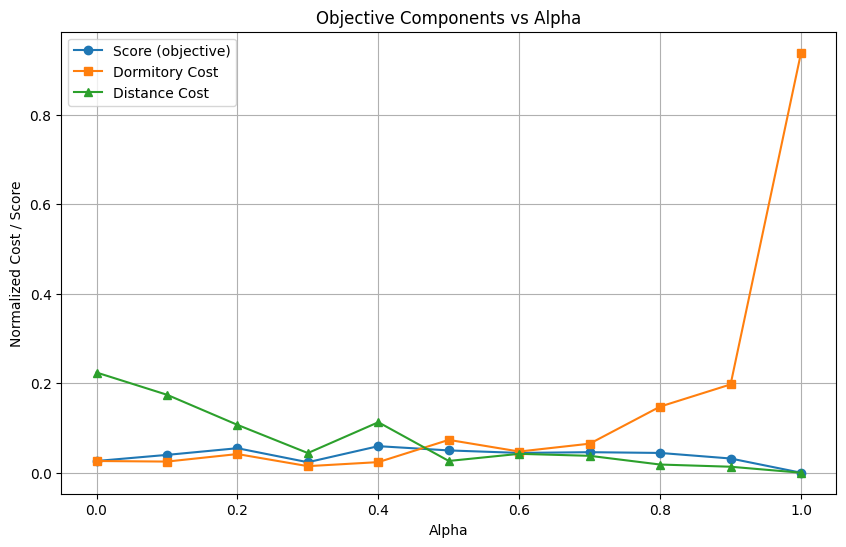

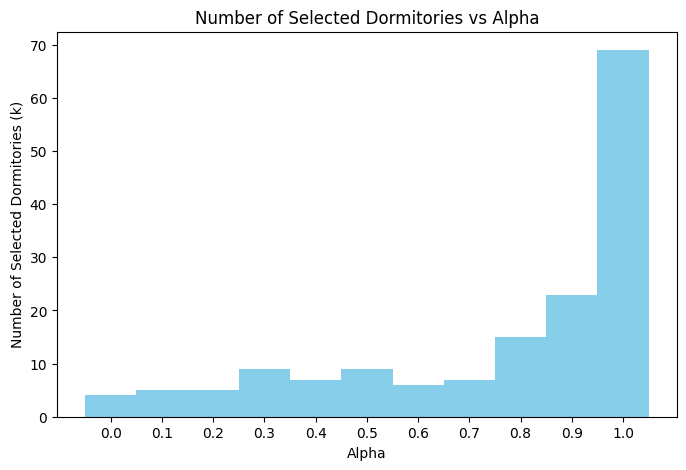

In [2070]:
import matplotlib.pyplot as plt

results = top10
alphas = [r['result']['alpha'] for r in results]
scores = [r['score'] for r in results]
dorm_costs = [r['result']['dormitory_cost'] for r in results]
distance_costs = [r['result']['distance_cost'] for r in results]
one_minus_alpha = [r['result']['1-alpha'] for r in results]

# Plot score, dormitory cost, and distance cost vs alpha
plt.figure(figsize=(10,6))
plt.plot(alphas, scores, marker='o', label='Score (objective)')
plt.plot(alphas, dorm_costs, marker='s', label='Dormitory Cost')
plt.plot(alphas, distance_costs, marker='^', label='Distance Cost')
plt.xlabel('Alpha')
plt.ylabel('Normalized Cost / Score')
plt.title('Objective Components vs Alpha')
plt.legend()
plt.grid(True)
plt.show()

# Optional: bar plot of selected dormitory counts vs alpha
selected_counts = [len(r['result']['selected_indices']) for r in results]

plt.figure(figsize=(8,5))
plt.bar(alphas, selected_counts, color='skyblue', width=0.1)
plt.xticks([i / 10 for i in range(0, 11)])
plt.xlabel('Alpha')
plt.ylabel('Number of Selected Dormitories (k)')
plt.title('Number of Selected Dormitories vs Alpha')
plt.show()

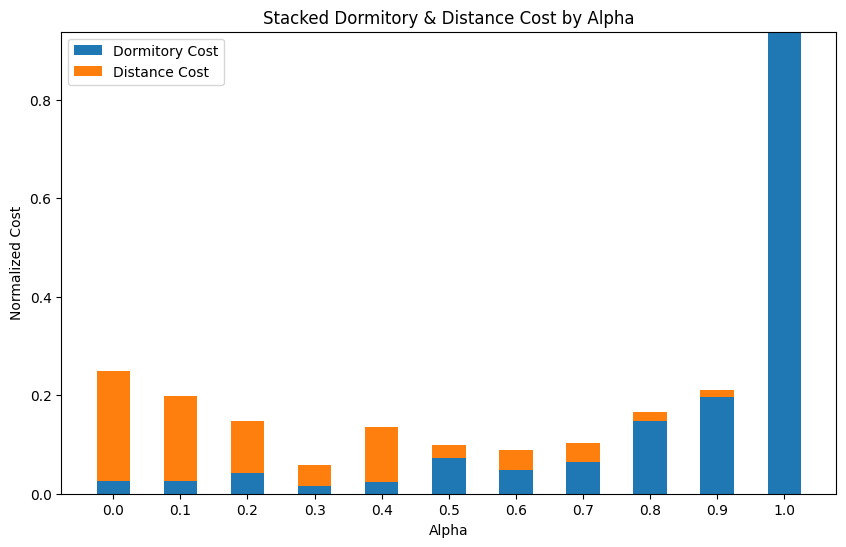

In [2071]:
ind = np.arange(len(alphas))
width = 0.5

plt.figure(figsize=(10,6))
plt.bar(ind, dorm_costs, width, label='Dormitory Cost')
plt.bar(ind, distance_costs, width, bottom=dorm_costs, label='Distance Cost')

plt.xticks(ind, [f"{a:.1f}" for a in alphas])
plt.xlabel('Alpha')
plt.ylabel('Normalized Cost')
plt.title('Stacked Dormitory & Distance Cost by Alpha')
plt.legend()
plt.show()

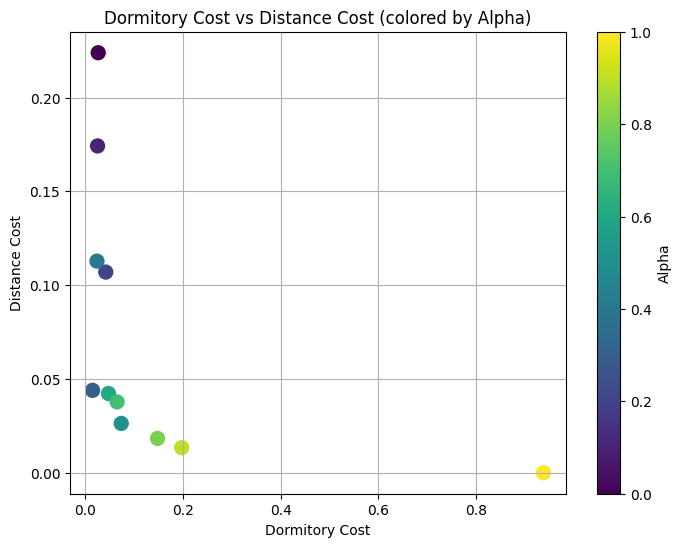

In [2072]:
plt.figure(figsize=(8,6))
plt.scatter(dorm_costs, distance_costs, c=alphas, cmap='viridis', s=100)
plt.colorbar(label='Alpha')
plt.xlabel('Dormitory Cost')
plt.ylabel('Distance Cost')
plt.title('Dormitory Cost vs Distance Cost (colored by Alpha)')
plt.grid(True)
plt.show()

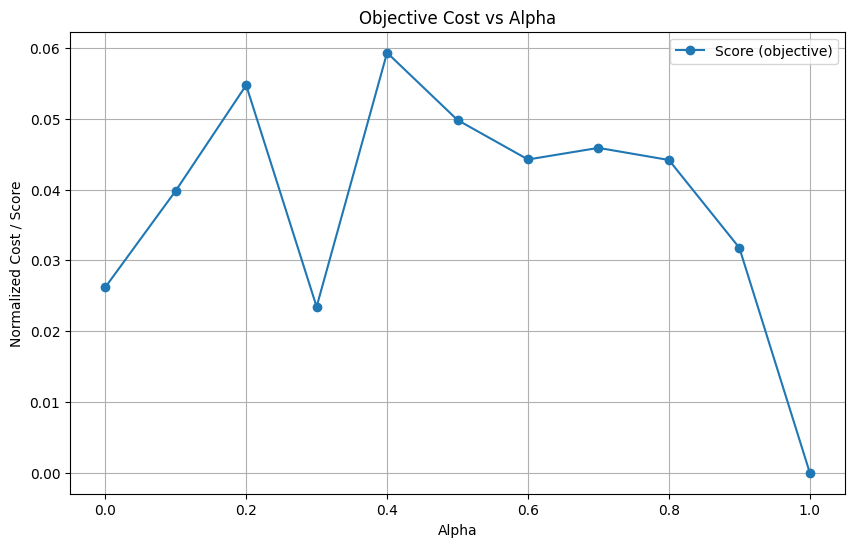

In [2073]:
plt.figure(figsize=(10,6))
plt.plot(alphas, scores, marker='o', label='Score (objective)')
plt.xlabel('Alpha')
plt.ylabel('Normalized Cost / Score')
plt.title('Objective Cost vs Alpha')
plt.legend()
plt.grid(True)
plt.show()